In [55]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.io import wavfile
import os
from tensorflow.audio import decode_wav
from tensorflow.io import read_file
from sklearn.feature_extraction.text import TfidfVectorizer
import tensorflow as tf

In [56]:
file = read_file('data/LibriSpeech/dev-clean/1272/128104/1272-128104-0000.wav')
audio, _ = decode_wav(file,desired_samples=100000)

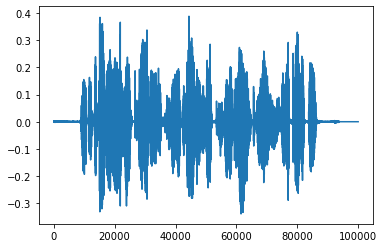

In [57]:
plt.plot(audio)

In [3]:
def get_data(dir_path):
    sigs = []
    samps = []
    y = []
    x = []
    for item in os.walk(dir_path):
        if item[2]:
            for rec in item[2]:
                if rec.endswith('.wav'):
                        samp, sig = wavfile.read(item[0] + '/' + rec)
                        samps.append(samp)
                        sigs.append(sig)
                elif rec.endswith('.txt'):
                    file = open(f'{item[0]}/' + rec)
                    obj = file.readlines()
                    for _ in obj:
                        text = _.split(maxsplit=1)[1].rstrip('\r\n')
                        y.append(text)
#     for item1,item2 in zip(sigs,samps):
#         x.append([item1[0:-1], item2])
#     y = np.array(y).reshape(-1,1)
    x = np.array(sigs)
    samp_freq = samps[0]
    return x, y, samp_freq

In [9]:
dir_path = 'data/LibriSpeech/dev-clean/'
X, Y, freq = get_data(dir_path)

In [59]:
short_x = tf.ragged.constant(X[0:20])

In [6]:
tfidf = TfidfVectorizer()

In [14]:
Y[1][0]

'WITHOUT ANY LEGAL SENTENCE WITHOUT ANY ROYAL MANDATE THE PATRIARCH AT THE DAWN OF DAY LED A SEDITIOUS MULTITUDE TO THE ATTACK OF THE SYNAGOGUES'

In [17]:
docs = [''.join(x[0]) for x in Y]

In [18]:
docs

['ARDENT IN THE PROSECUTION OF HERESY CYRIL AUSPICIOUSLY OPENED HIS REIGN BY OPPRESSING THE NOVATIANS THE MOST INNOCENT AND HARMLESS OF THE SECTARIES',
 'WITHOUT ANY LEGAL SENTENCE WITHOUT ANY ROYAL MANDATE THE PATRIARCH AT THE DAWN OF DAY LED A SEDITIOUS MULTITUDE TO THE ATTACK OF THE SYNAGOGUES',
 'SUCH CRIMES WOULD HAVE DESERVED THE ANIMADVERSION OF THE MAGISTRATE BUT IN THIS PROMISCUOUS OUTRAGE THE INNOCENT WERE CONFOUNDED WITH THE GUILTY AND ALEXANDRIA WAS IMPOVERISHED BY THE LOSS OF A WEALTHY AND INDUSTRIOUS COLONY',
 'THE ZEAL OF CYRIL EXPOSED HIM TO THE PENALTIES OF THE JULIAN LAW BUT IN A FEEBLE GOVERNMENT AND A SUPERSTITIOUS AGE HE WAS SECURE OF IMPUNITY AND EVEN OF PRAISE',
 'ORESTES COMPLAINED BUT HIS JUST COMPLAINTS WERE TOO QUICKLY FORGOTTEN BY THE MINISTERS OF THEODOSIUS AND TOO DEEPLY REMEMBERED BY A PRIEST WHO AFFECTED TO PARDON AND CONTINUED TO HATE THE PRAEFECT OF EGYPT',
 'A RUMOR WAS SPREAD AMONG THE CHRISTIANS THAT THE DAUGHTER OF THEON WAS THE ONLY OBSTACLE TO TH

In [19]:
tfidf.fit(docs)

TfidfVectorizer()

In [40]:
vocab = tfidf.get_feature_names()

In [41]:
idx = 0
for word in vocab:
    if word == 'ardent':
        print(idx)
    idx += 1

347


In [23]:
len(tfidf.get_feature_names())

8173

In [24]:
test_y = tfidf.transform(docs)

In [31]:
targets = test_y.toarray()

In [48]:
mask = np.where(targets[0] != 0)[0]

In [50]:
np.array(vocab)[mask]

array(['and', 'ardent', 'auspiciously', 'by', 'cyril', 'harmless',
       'heresy', 'his', 'in', 'innocent', 'most', 'novatians', 'of',
       'opened', 'oppressing', 'prosecution', 'reign', 'sectaries', 'the'],
      dtype='<U18')

'ARDENT IN THE PROSECUTION OF HERESY CYRIL AUSPICIOUSLY OPENED HIS REIGN BY OPPRESSING THE NOVATIANS THE MOST INNOCENT AND HARMLESS OF THE SECTARIES'

In [52]:
targets.shape

(2703, 8173)

In [4]:
def shorten_audio(x,y,freq, clip=10):
    lengths = []
    for audio in x:
        lengths.append(len(audio)/freq)
    lengths = np.array(lengths)
    mask = np.where(lengths < clip)[0]
    short_x = x[mask]
    clean_y = np.concatenate(y)
    short_y = clean_y[mask]
    return short_x, short_y

In [5]:
x,y = shorten_audio(X,Y,freq, clip=5)

In [6]:
from scipy.signal import spectrogram

In [19]:
len(X[2])

251120

In [26]:
spectrogram(X[2],nperseg=25)[2].shape

(13, 11414)

In [27]:
11414*25

285350

In [7]:
lens = []
for arr in x:
    lens.append(len(arr))

In [8]:
max(lens)

79840

In [9]:
def zero_pad(arr, length):
    l = len(arr)
    if l > length:
        result = arr[0:length]
    else:
        zero_pad = np.zeros(length-1)
        result = np.concatenate([arr, zero_pad])
    return result

In [22]:
# idx = range(200,300)

In [10]:
for i,arr in enumerate(x):
    x[i] = zero_pad(arr, 79840)[0:80000]

In [11]:
for arr in x:
    print(arr.shape)

(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(80000,)
(

In [82]:
from tensorflow import keras
from tensorflow.keras.layers import BatchNormalization, SimpleRNN, Input, TimeDistributed, Dense, Embedding, LSTM
from tensorflow.keras.models import Sequential, Model

In [26]:
def last_time_step_mse(Y_true, Y_pred):
    return keras.metrics.mean_squared_error(Y_true[:, -1], Y_pred[:, -1])

In [72]:
keras.backend.clear_session()

In [61]:
short_x[0].shape

TensorShape([101520])

In [73]:
def model_1():
    model = Sequential()
    model.add(Input(shape=(None,1),dtype='float32',ragged=True))
    model.add(SimpleRNN(20, return_sequences=True, activation='tanh'))
    model.add(SimpleRNN(20, return_sequences=True, activation='tanh'))
    model.add(TimeDistributed(Dense(8173, activation='softmax')))
    
    model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
    return model

In [83]:
input1 = Input(shape=(None,), ragged=True)
x = Embedding(8173, 2703)(input1)
x = LSTM(64)(x)
out = Dense(8173, activation='softmax')(x)
model = Model(inputs=[input1], outputs=[out])
model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, None)]            0         
_________________________________________________________________
embedding_1 (Embedding)      (None, None, 2703)        22091619  
_________________________________________________________________
lstm_1 (LSTM)                (None, 64)                708608    
_________________________________________________________________
dense_2 (Dense)              (None, 8173)              531245    
Total params: 23,331,472
Trainable params: 23,331,472
Non-trainable params: 0
_________________________________________________________________


In [84]:
history = model.fit(short_x, targets[0:20], epochs=10)

Epoch 1/10


/home/rasputin1127/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


ResourceExhaustedError: 2 root error(s) found.
  (0) Resource exhausted:  OOM when allocating tensor with shape[3134000,2703] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator gpu_host_bfc
	 [[node functional_1/embedding_1/embedding_lookup_ragged/embedding_lookup (defined at <ipython-input-84-bb557567fee0>:1) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

  (1) Resource exhausted:  OOM when allocating tensor with shape[3134000,2703] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator gpu_host_bfc
	 [[node functional_1/embedding_1/embedding_lookup_ragged/embedding_lookup (defined at <ipython-input-84-bb557567fee0>:1) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[gradient_tape/functional_1/lstm_1/RaggedToTensor/boolean_mask_1/Prod/_112]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

0 successful operations.
0 derived errors ignored. [Op:__inference_train_function_3537]

Errors may have originated from an input operation.
Input Source operations connected to node functional_1/embedding_1/embedding_lookup_ragged/embedding_lookup:
 functional_1/embedding_1/embedding_lookup_ragged/embedding_lookup/2503 (defined at /home/rasputin1127/anaconda3/lib/python3.7/contextlib.py:112)

Input Source operations connected to node functional_1/embedding_1/embedding_lookup_ragged/embedding_lookup:
 functional_1/embedding_1/embedding_lookup_ragged/embedding_lookup/2503 (defined at /home/rasputin1127/anaconda3/lib/python3.7/contextlib.py:112)

Function call stack:
train_function -> train_function


In [77]:
short_x

<tf.RaggedTensor [[-5, 13, -68, -14, 50, 19, -26, -42, -83, 5, 127, 100, 50, -6, -59, -17, 35, 82, 34, 147, 234, 68, -82, -84, -35, 12, 39, 73, 82, 4, -150, -91, 38, 51, -47, -105, -43, 45, -98, -193, -37, 64, 27, -20, -79, -62, 79, 71, -32, -18, -62, -14, 121, 51, -4, 92, 176, 166, -71, -205, -131, -56, 1, 7, 36, 97, 93, -144, -302, -212, -107, 25, 79, 118, 154, 87, -52, -90, -37, 93, 178, 154, 125, 93, 26, -7, 51, 45, 64, 26, -154, -132, -51, -165, -134, 49, 68, -49, -160, -195, -140, 3, 39, 96, 134, 111, 52, 2, 91, 164, 76, 18, 95, 235, 193, 6, -22, 90, 149, 157, 21, -107, -92, -56, -53, -27, -42, -34, 60, 88, 5, -49, 28, 99, 134, 66, -26, 50, 118, 99, 170, 128, -11, 7, 97, 152, 58, -148, -138, 20, 133, 30, -46, -15, 24, -52, -229, -286, -114, 105, 239, 152, -20, -146, -113, 13, 133, 134, 161, 158, 190, 97, -127, -147, 72, 259, 164, -29, -112, -72, 131, 105, -20, 5, 35, 41, -102, -247, -212, -73, 60, 72, 44, -33, -37, -9, 30, 67, 46, 46, 154, 139, 24, -31, -63, -7, 20, -24, -77, -63